In [1]:
import sys
sys.path.append('D:\home\sergey\infinite_album\guitar_synth\ddsp_simplified')
sys.path.append('D:\home\sergey\infinite_album\guitar_synth\ddsp_simplified\ddsp_simplified')

In [2]:
from ddsp_simplified.dataloader import load_track, get_raw_midi_features_from_file

In [3]:
mp3_path = 'D:/home/sergey/infinite_album/guitar_synth/ddsp_simplified/ddsp_simplified/audio_clips/Red_Guitar_powerchords_gated_eqed_midi_adjusted_denormalized/red_guitar.mp3'
midi_path = 'D:/home/sergey/infinite_album/guitar_synth/ddsp_simplified/ddsp_simplified/audio_clips/Red_Guitar_powerchords_gated_eqed_midi_adjusted_denormalized/red_guitar.MID'
sample_rate = 16000
frame_rate = 250

In [4]:
audio = load_track(path=mp3_path, sample_rate=sample_rate, pitch_shift=0)

In [5]:
midi = get_raw_midi_features_from_file(
    path_to_midi_file=midi_path, 
    frame_rate=frame_rate, 
    audio_length_seconds=len(audio) / sample_rate, 
    only_these_features=['pitch', 'velocity', 'cc_55', 'cc_56', 'distance_from_onset', 'distance_to_offset']
)

In [6]:
from utils.dataset_compressor import DatasetCompressor
compressor = DatasetCompressor()

In [7]:
compressed_audio, compressed_midi = compressor.compress_data(
    audio, 
    midi, 
    250,
    16000, 
    int(0.2*frame_rate)
);

In [8]:
import matplotlib.pyplot as plt
import numpy as np

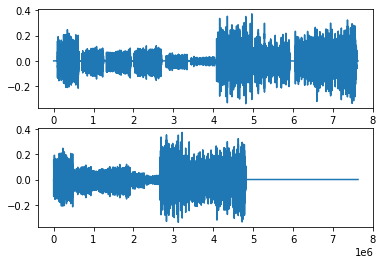

In [9]:
fig, axs = plt.subplots(2)

axs[0].plot(audio)
axs[1].plot(np.concatenate((compressed_audio,np.zeros(len(audio)-len(compressed_audio)))))

In [10]:
a1 = np.zeros(10)
a2 = np.ones(12)

np.concatenate((a1,a2), axis=0)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.])

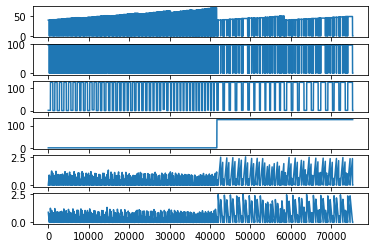

In [12]:
fig, axs = plt.subplots(6)

axs[0].plot(compressed_midi['pitch'])
axs[1].plot(compressed_midi['velocity'])
axs[2].plot(compressed_midi['cc_55'])
axs[3].plot(compressed_midi['cc_56'])
axs[4].plot(compressed_midi['distance_from_onset'])
axs[5].plot(compressed_midi['distance_to_offset'])


In [13]:
import IPython.display as ipd

In [19]:
ipd.Audio(data=compressed_audio, rate=16000)